<a href="https://colab.research.google.com/github/Basantallam/unilm/blob/master/Evaluation_of_Object_Detection_Test_Set.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!rm -r TransformersFromScratch

rm: cannot remove 'TransformersFromScratch': No such file or directory


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!git clone https://github.com/Basantallam/TransformersFromScratch/

Cloning into 'TransformersFromScratch'...
remote: Enumerating objects: 1348, done.
remote: Counting objects: 100% (309/309), done.
remote: Compressing objects: 100% (178/178), done.
remote: Total 1348 (delta 211), reused 203 (delta 131), pack-reused 1039
Receiving objects: 100% (1348/1348), 96.09 MiB | 13.73 MiB/s, done.
Resolving deltas: 100% (626/626), done.


In [15]:
import re
import json
with open('/content/drive/MyDrive/Bachelor/Results/test.json') as f:
    true_json = json.load(f)
print(type(true_json))

ctr=0
true_boxes=list()
gt_dict={}
print(true_json.keys())
for ann in true_json['annotations']:
  true_box=list()
  #print(ann)
  if(ann['image_id'] in gt_dict):
    gt_dict[ann['image_id']].append(ann['bbox'])
    gt_dict[ann['image_id']].append(ann['category_id'])

  else:
    gt_dict[ann['image_id']]=list()
    gt_dict[ann['image_id']].append(ann['bbox']) #saved here as relative
    gt_dict[ann['image_id']].append(ann['category_id'])

  true_box.append(ann['image_id'])
  true_box.append(ann['category_id'])
  true_box.append(1)
  true_box.append(ann['bbox'][0])
  true_box.append(ann['bbox'][1])
  true_box.append(ann['bbox'][2]+ann['bbox'][0]) #from rel to absolute corners
  true_box.append(ann['bbox'][3]+ann['bbox'][1])
  #print(true_box)
  true_boxes.append(true_box)
  ctr=ctr+1

#print(true_boxes)
print(gt_dict)


<class 'dict'>
dict_keys(['images', 'annotations', 'categories'])


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [16]:
import json
import re
with open('/content/drive/MyDrive/Bachelor/Results/all_test_bbox_preds.json') as f:
    dets_json = json.load(f)
n1=0
n2=0
ctr=0
pred_boxes=list()
print(len(dets_json))
for c in dets_json:
  if c=='{':
    n1=ctr
  elif c=='}':
    pred_box=list()
    new_dict={}
    n2=ctr
    json_object=''.join(dets_json[n1+1:n2])
    keyValue=re.split(', | [|],|: |\'',json_object)
    
    pred_box.append(eval(keyValue[3]))
    pred_box.append(eval(keyValue[7])+1)
    pred_box.append(eval(keyValue[18]))
    pred_box.append(eval(keyValue[11][1:len(keyValue[11])]))
    pred_box.append(eval(keyValue[12]))
    pred_box.append(eval(keyValue[13])) #absolute
    pred_box.append(eval(keyValue[14][0:len(keyValue[14])-1]))
    pred_boxes.append(pred_box)
    #print(pred_box)
    
  ctr=ctr+1


13053966


In [ ]:
print(len(true_boxes))

124917


In [ ]:
print(len(pred_boxes))

107781


In [ ]:
from TransformersFromScratch.ML.Pytorch.object_detection.metrics import mean_avg_precision

In [ ]:
pred_boxes_with_iou,map_75 = mean_avg_precision.mean_average_precision(pred_boxes, true_boxes,iou_threshold=0.75)
print(map_75.item())

0.7612133622169495


In [ ]:
print(map_75.item())

0.7612133622169495


In [ ]:
pred_boxes_with_iou,map_50 = mean_avg_precision.mean_average_precision(pred_boxes, true_boxes,iou_threshold=0.5)

In [ ]:
print(map_50.item())
#0.7816267609596252

0.7816267609596252


# **Mean average Precision IoU@0.75 = 0.7612133622169495** 
# **Mean average Precision IoU@0.5 =0.7816267609596252**

# **Visualization**

In [3]:
import json
with open('/content/drive/MyDrive/Bachelor/Results/id_to_name.json') as f:
    id_to_name = json.load(f)
print(type(id_to_name))
id_to_name=dict(id_to_name)

<class 'dict'>


In [4]:
!pip install -q -U albumentations
!echo "$(pip freeze | grep albumentations) is successfully installed"

     |████████████████████████████████| 102 kB 6.6 MB/s 
     |████████████████████████████████| 90.3 MB 155 kB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
albumentations==1.1.0 is successfully installed


In [5]:
!pip install cv2

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement cv2 (from versions: none)
ERROR: No matching distribution found for cv2


In [6]:
!pip install "opencv-python-headless<4.3"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 21.6 MB 503 kB/s 
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.6.0.66
    Uninstalling opencv-python-headless-4.6.0.66:
      Successfully uninstalled opencv-python-headless-4.6.0.66


In [7]:
import random

import cv2
from matplotlib import pyplot as plt

import albumentations as A

In [8]:
import inspect
import os
import json
PRED_BOX_COLOR = (255, 0, 0) # Red
GT_BOX_COLOR = (0, 255, 0) # Red

TEXT_COLOR = (255, 255, 255) # White


def visualize_bbox(isPred, img, bbox, class_name, thickness=2):
    """Visualizes a single bounding box on the image"""
    x_min, y_min, w, h = bbox
    x_min, x_max, y_min, y_max = int(x_min), int(x_min + w), int(y_min), int(y_min + h)
    if isPred:
      BOX_COLOR = PRED_BOX_COLOR
    else:
      BOX_COLOR = GT_BOX_COLOR
    cv2.rectangle(img, (x_min, y_min), (x_max, y_max), BOX_COLOR, thickness=thickness)
    
    ((text_width, text_height), _) = cv2.getTextSize(class_name, cv2.FONT_HERSHEY_SIMPLEX, 0.35, 1) 
   
    cv2.rectangle(img, (x_min, y_min - int(1.3 * text_height)), (x_min + text_width, y_min), BOX_COLOR, -1)
    cv2.putText(
        img,
        text=class_name,
        org=(x_min, y_min - int(0.3 * text_height)),
        fontFace=cv2.FONT_HERSHEY_SIMPLEX,
        fontScale=0.35, 
        color=TEXT_COLOR, 
        lineType=cv2.LINE_AA,
    )
    return img


def visualize(image, bboxes, category_ids, category_id_to_name, isPred):
    img = image.copy()
    for bbox, category_id, pred in zip(bboxes, category_ids, isPred):
        #print(bbox," ",pred)
        class_name = category_id_to_name[category_id]
        img = visualize_bbox(pred,img, bbox, class_name)
    plt.figure(figsize=(12, 12))
    plt.axis('off')
    plt.imshow(img)
  

In [ ]:
print(bboxes)

[[310.21237, 420.81454, 550.486, 523.19244]]


In [ ]:
print(gt_dict[0])

PMC1686297_00006.jpg
PMC1686297_00007.jpg
PMC1686297_00006.jpg
PMC1686297_00006.jpg
PMC1686297_00006.jpg
PMC1686297_00007.jpg
PMC5671403_00006.jpg
PMC1686297_00007.jpg
PMC4633074_00003.jpg
PMC1686297_00007.jpg
PMC4633074_00003.jpg
PMC4633074_00003.jpg
PMC2967836_00003.jpg
PMC1686297_00007.jpg
PMC3216363_00002.jpg
PMC5192512_00002.jpg
PMC3401531_00003.jpg
PMC5192512_00002.jpg
PMC5012259_00016.jpg
PMC3132526_00002.jpg
PMC4633074_00002.jpg


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:41: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


PMC3878410_00003.jpg
PMC2740000_00002.jpg
PMC2740000_00002.jpg
PMC1686297_00007.jpg
PMC1686297_00007.jpg
PMC5065999_00003.jpg
PMC2740228_00002.jpg
PMC1686297_00006.jpg
PMC4887625_00007.jpg
PMC2744046_00018.jpg
PMC4633074_00003.jpg
PMC5546125_00006.jpg
PMC5750342_00002.jpg
PMC5750342_00002.jpg
PMC1686297_00007.jpg
PMC4633074_00003.jpg
PMC4639484_00002.jpg
PMC2915657_00001.jpg
PMC5192512_00002.jpg
PMC4633074_00003.jpg
PMC4541009_00003.jpg
PMC4633074_00003.jpg
PMC5558067_00003.jpg
PMC5217343_00013.jpg
PMC2740000_00002.jpg
PMC2740000_00002.jpg
PMC3615296_00006.jpg
PMC5558067_00003.jpg
PMC5012259_00016.jpg


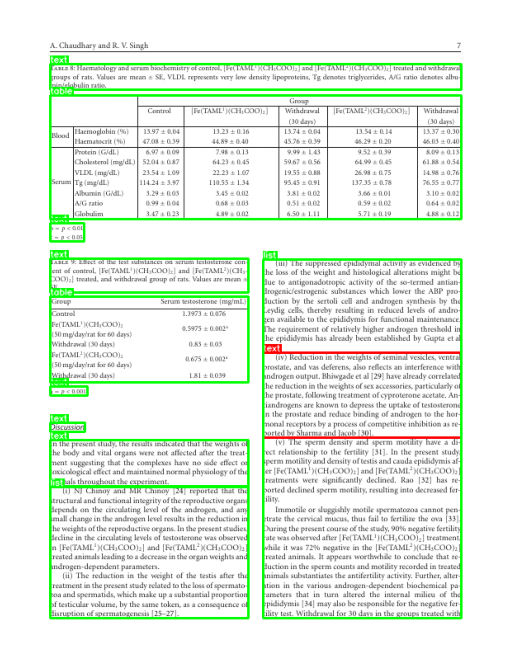

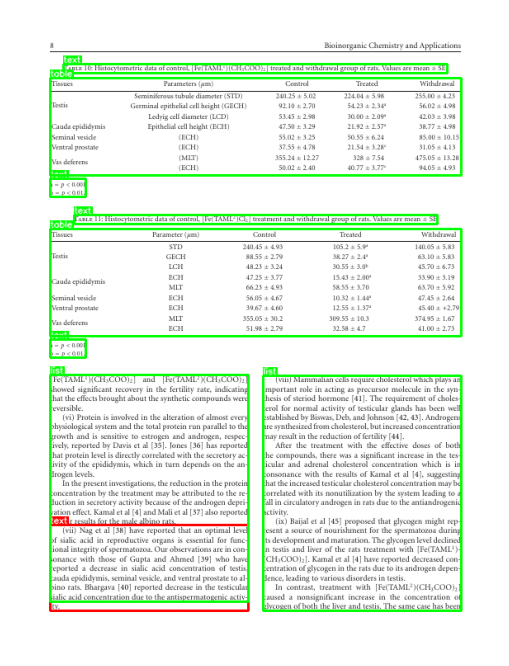

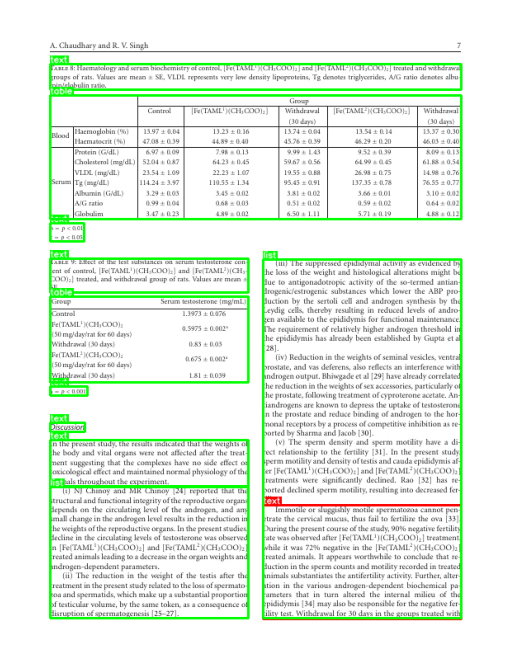

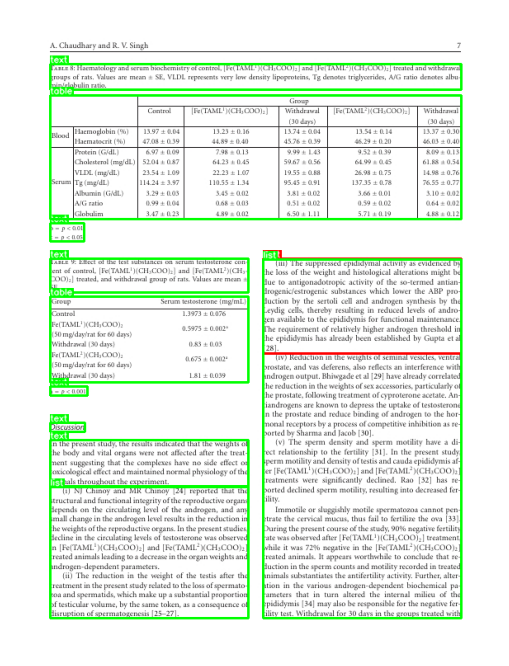

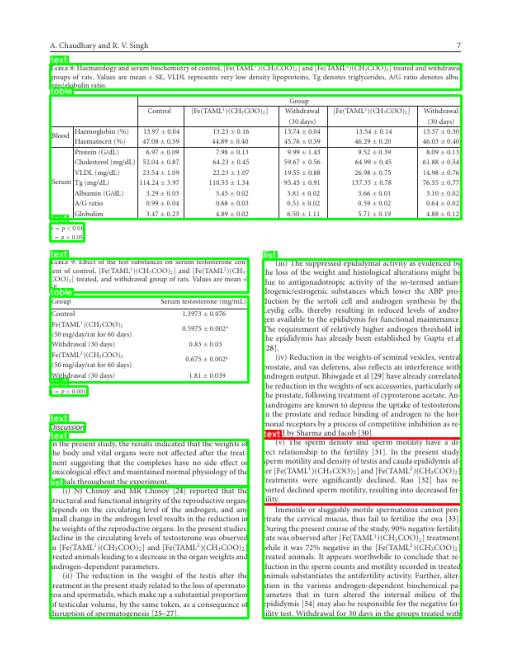

...

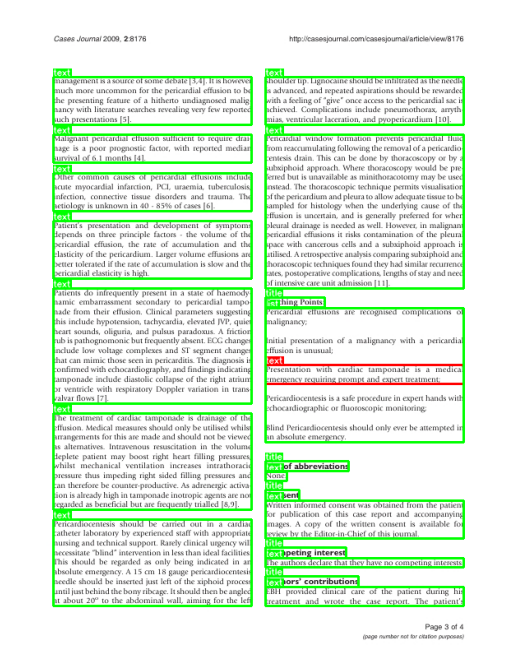

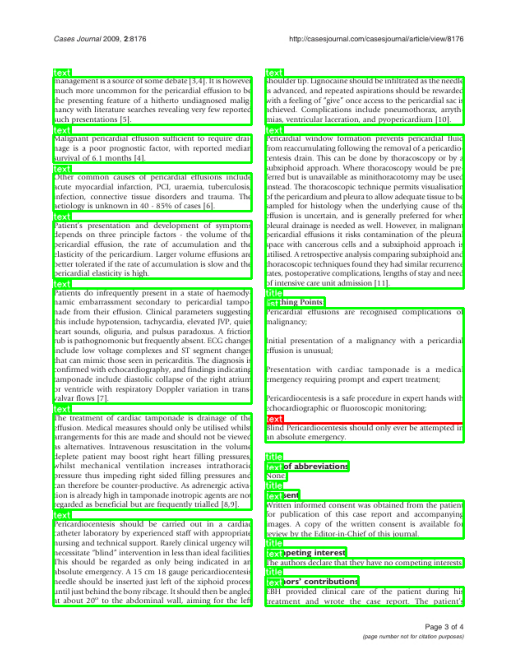

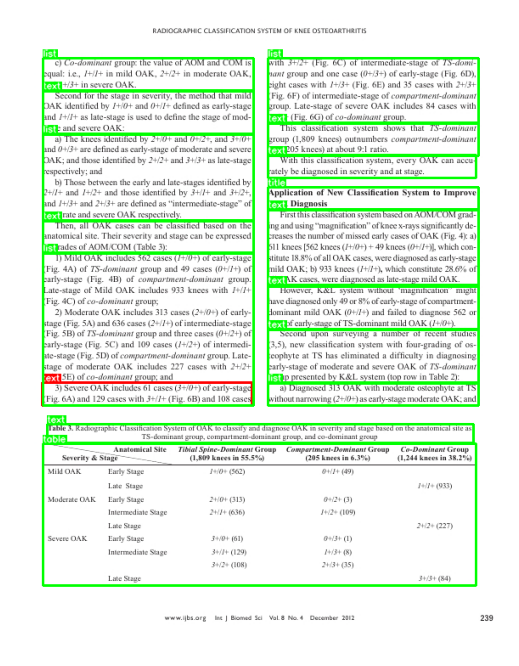

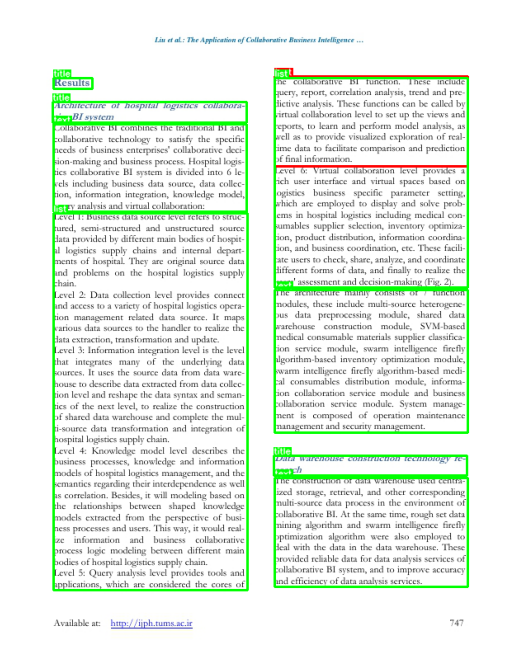

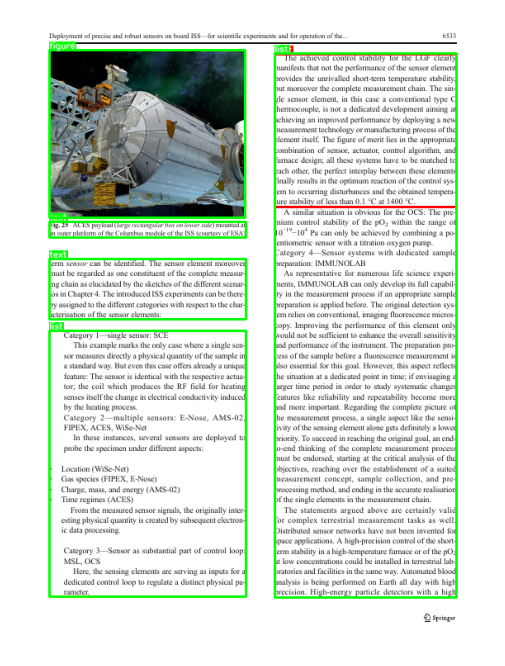

In [17]:
import os
category_id_to_name ={1:"text",2:"title",3:"list",4:"table",5:"figure"}
with open('/content/drive/MyDrive/Bachelor/Results/OD/test/IoU_0_20.json') as f:
  worst = json.load(f)

for j in range(50):
  category_ids=[]
  #print(worst[j].keys())
  #print(os.path.join("drive/MyDrive/Bachelor/Results/worst_OD_pred",str(os.path.splitext(worst[j]['image_name'])[0])+str('.png')))
  image = cv2.imread(os.path.join("drive/MyDrive/Bachelor/Results/OD/test/worst_OD_pred",str(os.path.splitext(worst[j]['image_name'])[0])+str('.png')))
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  bbox = worst[j]['bbox']

  bbox[2]=bbox[2]-bbox[0] #from abs to rel
  bbox[3]=bbox[3]-bbox[1]
  #print('bbox', bbox)

  category_ids=category_ids+([worst[j]['category_id']])

  isPred=[True]
  GTs=gt_dict[worst[j]['image_id']]
  print(worst[j]['image_name'])
  gt_bboxes=list()
  gt_category=list()
  for idx,g in enumerate(GTs):
    if idx%2==0:
      gt_bboxes.append(list(g))
    else:
      gt_category.append(g)

  bboxes=[bbox]+ gt_bboxes
  #print('bboxes 2: ',bbox)
  category_ids= category_ids+gt_category
  isPred=isPred+[False]*len(GTs)
  
  visualize(image, bboxes, category_ids, category_id_to_name, isPred)